In [ ]:
!git clone https://github.com/humanoid-purdue/prairie-drl


Cloning into 'prairie-drl'...
remote: Enumerating objects: 1739, done.
remote: Counting objects: 100% (179/179), done.
remote: Compressing objects: 100% (131/131), done.
remote: Total 1739 (delta 113), reused 99 (delta 48), pack-reused 1560 (from 2)
Receiving objects: 100% (1739/1739), 39.61 MiB | 20.62 MiB/s, done.
Resolving deltas: 100% (1128/1128), done.


In [ ]:
!pip install mediapy
!pip install jax
!pip install mujoco
!pip install git+https://github.com/google/brax.git@main
!pip install flax
!pip install dill
!pip install mediapy
!pip install mujoco_mjx
!pip install jaxopt

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 35.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.4/44.4 kB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.4/6.4 MB 70.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 243.4/243.4 kB 24.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 23.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 172.3/172.3 kB 21.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.5/76.5 kB 9.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.7/6.7 MB 115.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 90.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 11.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 707.0/707.0 kB 57.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 119.4/119.4 kB 4.9 MB/s eta 0:00:00


In [2]:
%cd prairie-drl

/content/prairie-drl


In [ ]:
!ls

sample_data


In [2]:
!git reset --hard HEAD
!git pull origin main

HEAD is now at af4f09b a
remote: Enumerating objects: 9, done.
remote: Counting objects: 100% (9/9), done.
remote: Compressing objects: 100% (1/1), done.
remote: Total 5 (delta 4), reused 5 (delta 4), pack-reused 0 (from 0)
Unpacking objects: 100% (5/5), 426 bytes | 213.00 KiB/s, done.
From https://github.com/humanoid-purdue/prairie-drl
 * branch            main       -> FETCH_HEAD
   af4f09b..e39b293  main       -> origin/main
Updating af4f09b..e39b293
Fast-forward
 nemo2/nemo2.xml | 2 +-
 nemo_env_pd.py  | 4 ++--
 2 files changed, 3 insertions(+), 3 deletions(-)


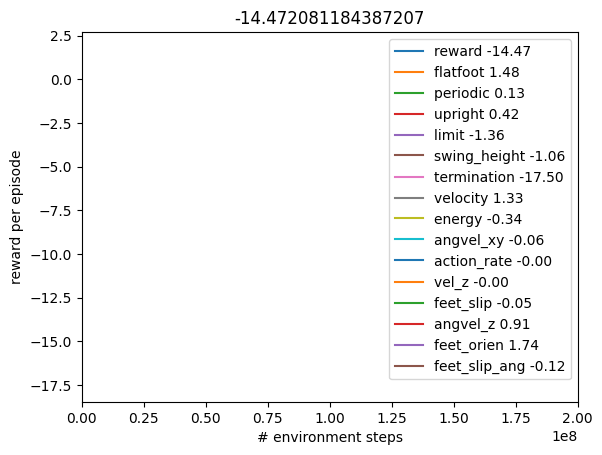

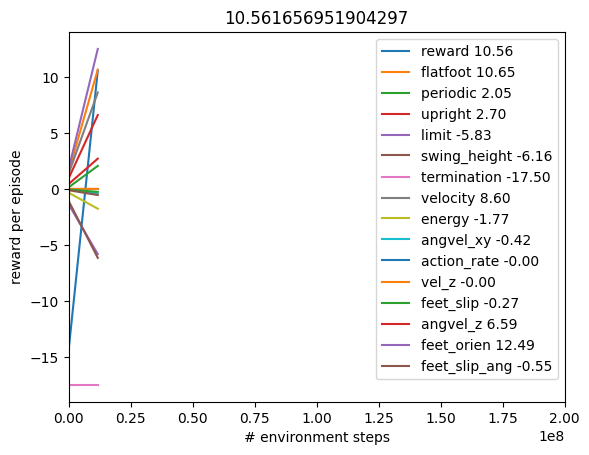

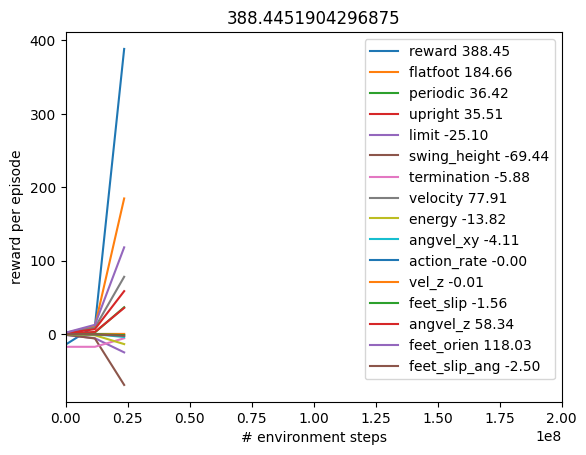

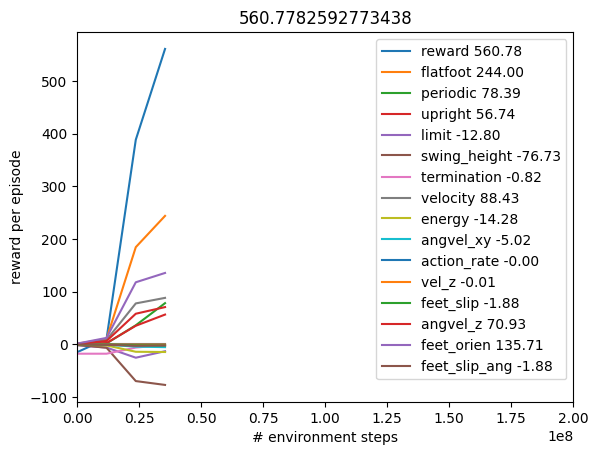

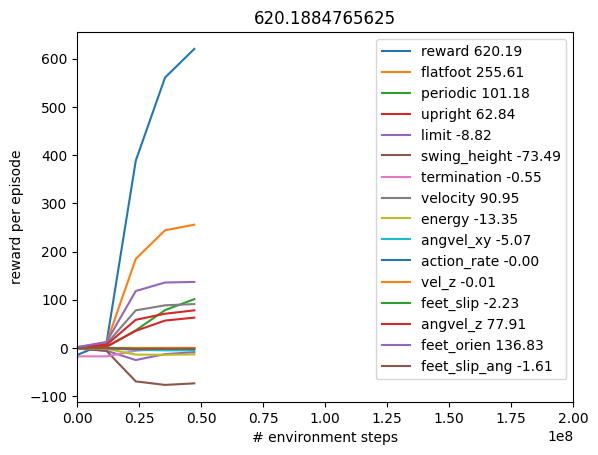

...

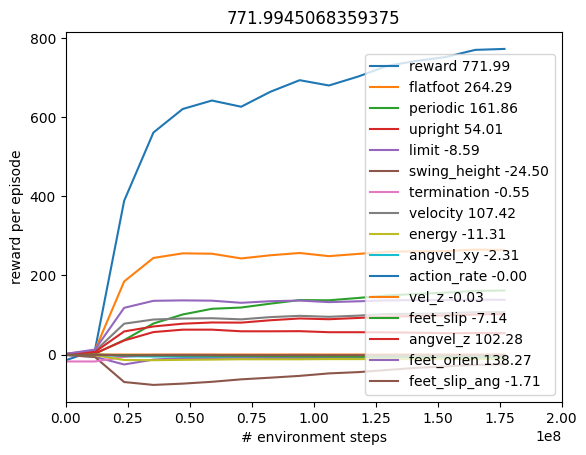

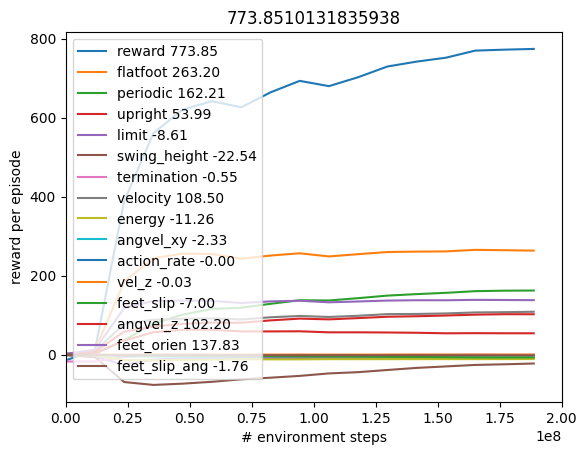

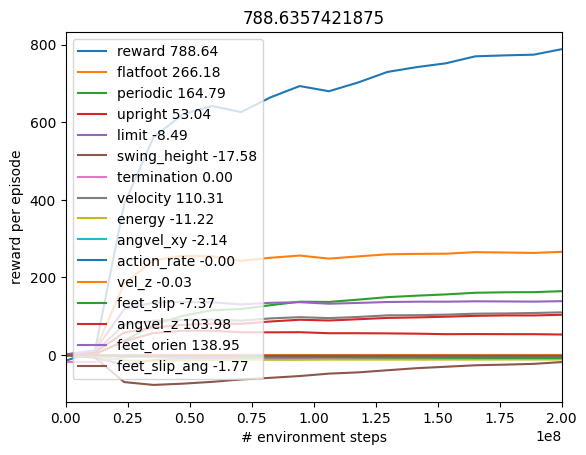

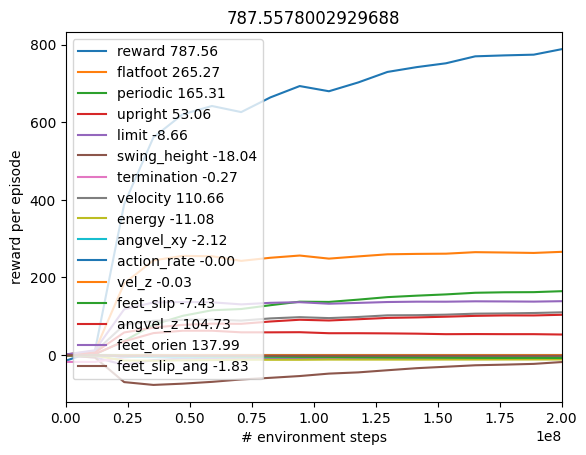

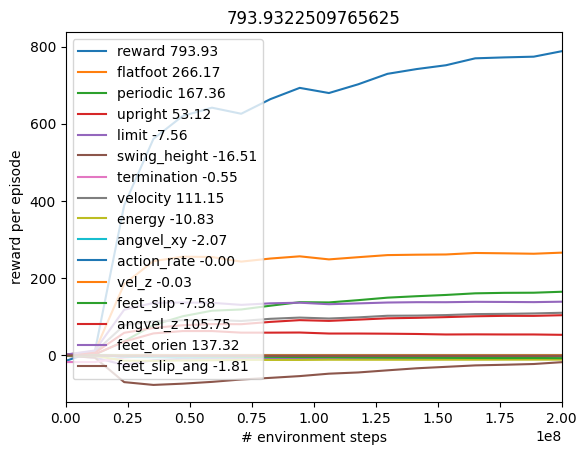

In [3]:
import train as train
import dill
make_inference_fn, params, _= train.train_fn(environment=train.env,
                                       progress_fn=train.progress,
                                       eval_env=train.eval_env)

train.model.save_params("walk_policy", params)

with open("inference_fn", 'wb') as f:
    dill.dump(make_inference_fn, f)

In [ ]:
import nemotest
from IPython.display import HTML
from brax.io import html
env, rollout = nemotest.makeRollout()
HTML(html.render(env.sys.tree_replace({'opt.timestep': env.dt}), rollout))

In [3]:
import nemotest
from IPython.display import HTML
from brax.io import html
env, rollout = nemotest.makeRollout()
HTML(html.render(env.sys.tree_replace({'opt.timestep': env.dt}), rollout))

In [ ]:
import nemotest
from IPython.display import HTML
from brax.io import html
env, rollout = nemotest.makeRollout()
HTML(html.render(env.sys.tree_replace({'opt.timestep': env.dt}), rollout))

In [ ]:
import nemotest
from IPython.display import HTML
from brax.io import html
env, rollout = nemotest.makeRollout()
HTML(html.render(env.sys.tree_replace({'opt.timestep': env.dt}), rollout))

In [ ]:
from jaxopt import EqualityConstrainedQP
import jax.numpy as jnp

Q = 2 * jnp.array([[2.0, 0.5], [0.5, 1]])
c = jnp.array([1.0, 1.0])
A = jnp.array([[1.0, 1.0], [2., 2.]])
b = jnp.array([1.0, 2.])

qp = EqualityConstrainedQP()
sol = qp.run(params_obj=(Q, c), params_eq=(A, b)).params

print(sol.primal)
print(sol.dual_eq)

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[0.24999988 0.7499998 ]
[-0.54999983 -1.0999997 ]
